# Imports

In [1]:
import sys
sys.path.append("../Face_detection")
sys.path.append("../")

import glob
import zipfile
import os
import random
import cv2

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from PIL import Image
from sklearn.metrics import f1_score
from face_detection import predict_detected_faces
from data_augmenation_pipeline import DataAugmentationPipeline
from tensorflow.keras.applications import MobileNetV2, MobileNet, EfficientNetB0, ResNet50, InceptionV3, VGG16
from tensorflow.keras import regularizers, initializers, Sequential
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, SpatialDropout2D, GlobalMaxPooling2D, AveragePooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2025-07-31 07:57:58.486766: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-31 07:57:58.530833: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-31 07:57:58.530869: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-31 07:57:58.531944: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-31 07:57:58.539625: I tensorflow/core/platform/cpu_feature_guar

In [2]:
gpus = tf.config.list_physical_devices('GPU')
print(gpus)

tf.config.set_visible_devices(gpus[1], 'GPU')  # Select GPU:1

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


# Hyperparameter for the model

In [3]:
batch_size = 24
target_size = (224, 224)
learning_rate = 0.0001
kernel_s = (3, 3)
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=5)

# Data Augmentation

In [4]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=0.6195793051269638,
    shear_range=0.040957683397623304,
    zoom_range=0.01551975506551656,
    width_shift_range=0.04749344961536198,
    height_shift_range=0.09783741203747219,
    horizontal_flip=True,
    brightness_range=[0.7, 1.3]
)

train_gen=train_datagen.flow_from_directory(
    'Train',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

valid_datagen = ImageDataGenerator(rescale=1./255)

valid_gen=valid_datagen.flow_from_directory(
    'Validate',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

test_gen=valid_datagen.flow_from_directory(
    'Test',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 5569 images belonging to 5 classes.
Found 696 images belonging to 5 classes.
Found 697 images belonging to 5 classes.


# Plotting a batch of training data

Class labels: ['Asian', 'Black', 'Indian', 'Other', 'White']


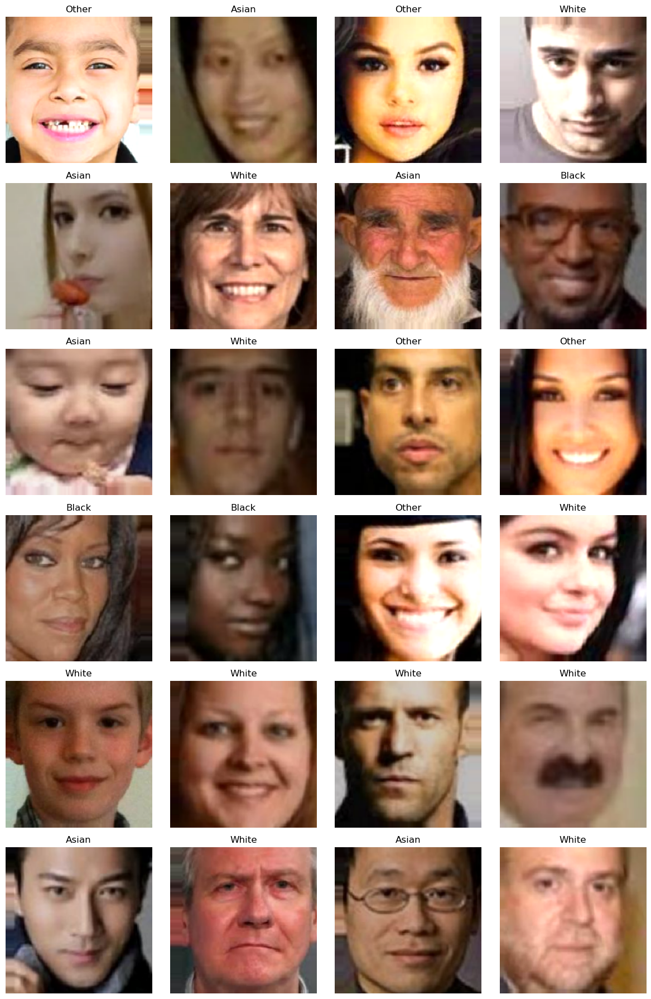

In [5]:
x_batch, y_batch = next(train_gen)
num_images = x_batch.shape[0]
cols = 4
rows = (num_images + cols - 1) // cols

class_labels = list(train_gen.class_indices.keys())
print(f"Class labels: {class_labels}")

fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
axes = axes.flatten()

for i in range(num_images):
    ax = axes[i]
    ax.imshow(x_batch[i])
    
    class_index = y_batch[i].argmax()
    label = class_labels[class_index]
    
    ax.set_title(label)
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Set up and configure a model for training

In [6]:
# These two models are also not bad
# base_model = MobileNet(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # Is correct on the test data, but not on my own
# base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # Works for my images, but isn't correct on the test data

# https://arxiv.org/abs/1409.4842 - Paper of the Inception architecture
base_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
# base_model.trainable = False 

base_model.trainable = True
for layer in base_model.layers[:-50]:
    layer.trainable = False

model = Sequential([
    base_model,
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(5, activation='softmax')
])

model.summary()

2025-07-31 07:58:10.294166: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46725 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 51200)             0         
                                                                 
 dense (Dense)               (None, 1024)              52429824  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 5)                 5125      
                                                                 
Total params: 74237733 (283.19 MB)
Trainable params: 59608261 (227.39 MB)
Non-trainable params: 14629472 (55.81 MB)
_________________________________________________________________


# Compile the model and start the training

In [7]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

history = model.fit(
    train_gen,
    batch_size=batch_size,
    epochs=40,
    validation_data=valid_gen,
    steps_per_epoch=len(train_gen), # 100 
    callbacks=[early_stopping]
)

Epoch 1/40


2025-07-31 07:58:35.720695: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2025-07-31 07:58:38.798884: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f5948d51b10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-07-31 07:58:38.798916: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-07-31 07:58:38.804806: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1753948718.938489   25144 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


233/233 [==============================] - 72s 259ms/step - loss: 3.4276 - acc: 0.4845 - val_loss: 1.0307 - val_acc: 0.6106
Epoch 2/40
233/233 [==============================] - 56s 241ms/step - loss: 1.0114 - acc: 0.6428 - val_loss: 0.9364 - val_acc: 0.6667
Epoch 3/40
233/233 [==============================] - 55s 235ms/step - loss: 0.9184 - acc: 0.6786 - val_loss: 1.2352 - val_acc: 0.5963
Epoch 4/40
233/233 [==============================] - 55s 237ms/step - loss: 0.9820 - acc: 0.6613 - val_loss: 0.8223 - val_acc: 0.6925
Epoch 5/40
233/233 [==============================] - 55s 234ms/step - loss: 0.8869 - acc: 0.6937 - val_loss: 0.8798 - val_acc: 0.6940
Epoch 6/40
233/233 [==============================] - 55s 235ms/step - loss: 0.8056 - acc: 0.7240 - val_loss: 0.8307 - val_acc: 0.6997
Epoch 7/40
233/233 [==============================] - 55s 236ms/step - loss: 0.7396 - acc: 0.7427 - val_loss: 0.8633 - val_acc: 0.6983
Epoch 8/40
233/233 [==============================] - 54s 234ms/st

# Data Augmenation Pipeline

In [35]:
def generate_random_config():
    return {
        'rotation': random.uniform(0, 10),             
        'zoom': random.uniform(0, 0.25),             
        'width_shift': random.uniform(0, 0.1),
        'height_shift': random.uniform(0, 0.1),
        'shear': random.uniform(0, 0.1),           
        'hflip': True,                                
        'brightness': random.choice([[0.7, 1.3], [0.8, 1.2], None]) 
}

results = []

for i in range(10):
    config = generate_random_config()
    print(f"\n[INFO] Running config {i+1}: {config}")
    pipeline = DataAugmentationPipeline(config=config, batch_size=batch_size, target_size=target_size, class_mode='categorical')
    
    train_gen = pipeline.get_train_generator()
    valid_gen = pipeline.get_valid_generator()
    test_gen = pipeline.get_test_generator()
    
    # Build the model for each iteration new
    base_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
    # base_model.trainable = False

    base_model.trainable = True
    for layer in base_model.layers[:-50]:
        layer.trainable = False

    model = Sequential([
        base_model,
        Flatten(),
        Dense(1024, activation='relu'),
        Dropout(0.5),
        Dense(5, activation='softmax')
    ])
    
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['acc'])

    history = model.fit(
        train_gen,
        batch_size=batch_size,
        epochs=40,
        validation_data=valid_gen,
        steps_per_epoch=100,
        callbacks=[early_stopping]
    )
    
    # Evaluate on test dataset
    test_loss, test_acc = model.evaluate(test_gen, verbose=0)
    
    results.append({
        'config': config,
        'val_acc': max(history.history['val_acc']),
        'test_acc': test_acc,
        'history': history.history
    })

# Sorted after best test accuracy
results = sorted(results, key=lambda x: x['test_acc'], reverse=True)

for r in results:
    print(f"\nConfig: {r['config']}\n-> Val Acc: {r['val_acc']:.4f} | Test Acc: {r['test_acc']:.4f}")


[INFO] Running config 1: {'rotation': 1.217339181891014, 'zoom': 0.17099303103209534, 'width_shift': 0.05598071631201319, 'height_shift': 0.040792720808534404, 'shear': 0.0961011572842596, 'hflip': True, 'brightness': None}
Found 5569 images belonging to 5 classes.
Found 696 images belonging to 5 classes.
Found 697 images belonging to 5 classes.
Epoch 1/40
100/100 [==============================] - 29s 223ms/step - loss: 7.2231 - acc: 0.4071 - val_loss: 1.1780 - val_acc: 0.5704
Epoch 2/40
100/100 [==============================] - 21s 208ms/step - loss: 1.1491 - acc: 0.5683 - val_loss: 1.0321 - val_acc: 0.6078
Epoch 3/40
100/100 [==============================] - 21s 209ms/step - loss: 1.0589 - acc: 0.6246 - val_loss: 1.1980 - val_acc: 0.5891
Epoch 4/40
100/100 [==============================] - 23s 232ms/step - loss: 1.0005 - acc: 0.6462 - val_loss: 1.0218 - val_acc: 0.6336
Epoch 5/40
100/100 [==============================] - 21s 208ms/step - loss: 1.0074 - acc: 0.6428 - val_loss: 1

# Plot the results of the training with a Data Augmentation Pipeline

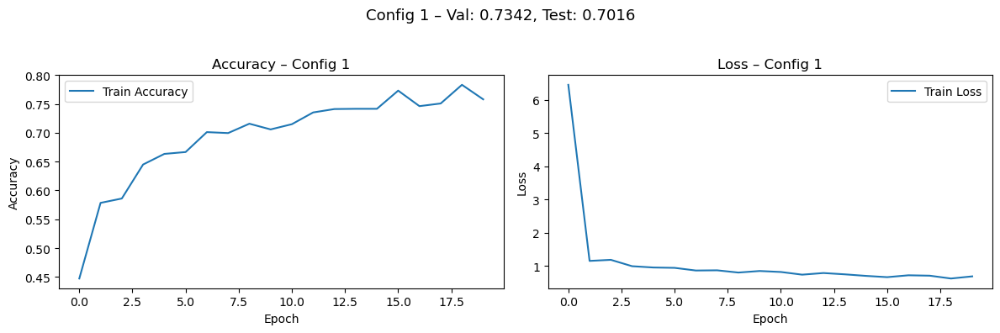

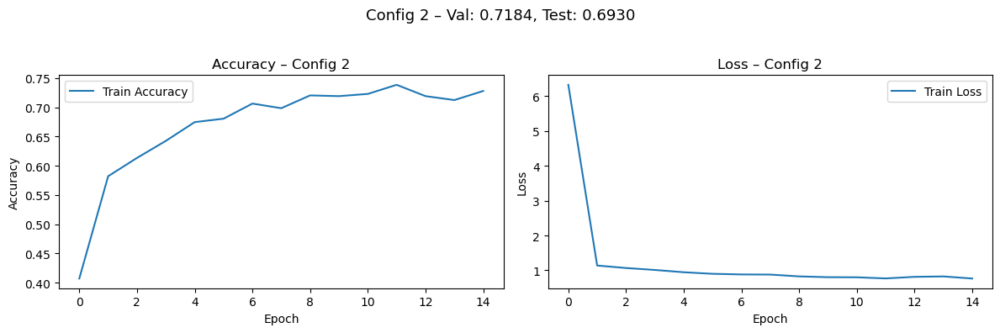

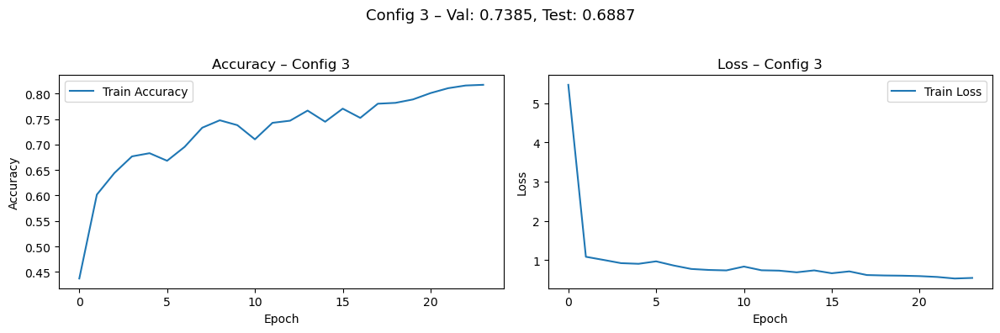

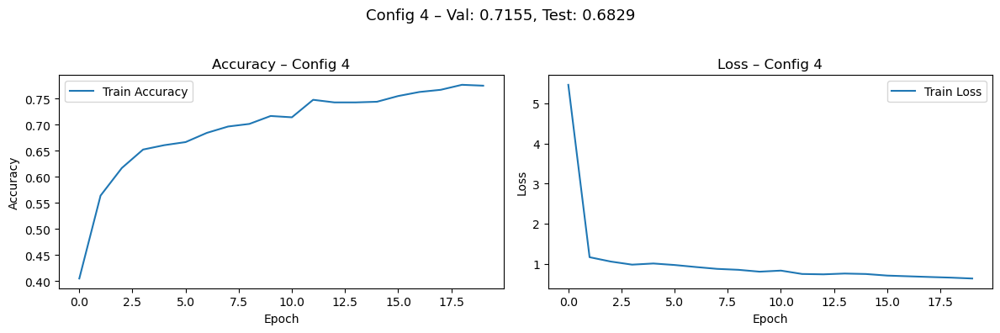

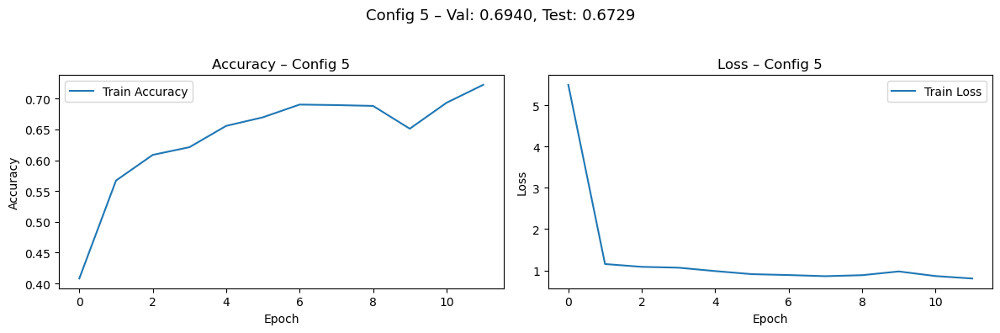

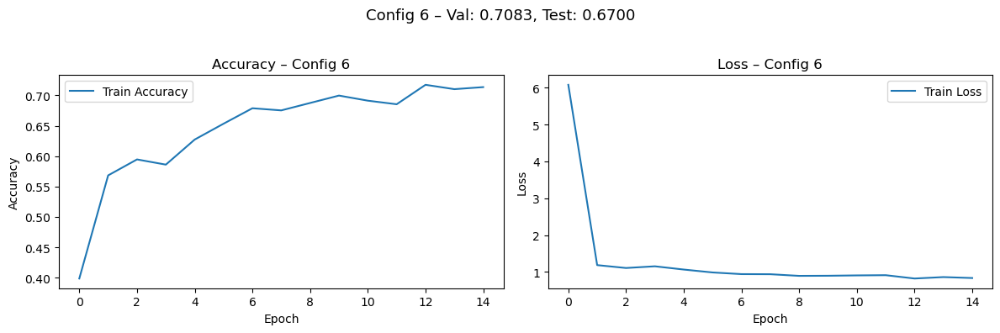

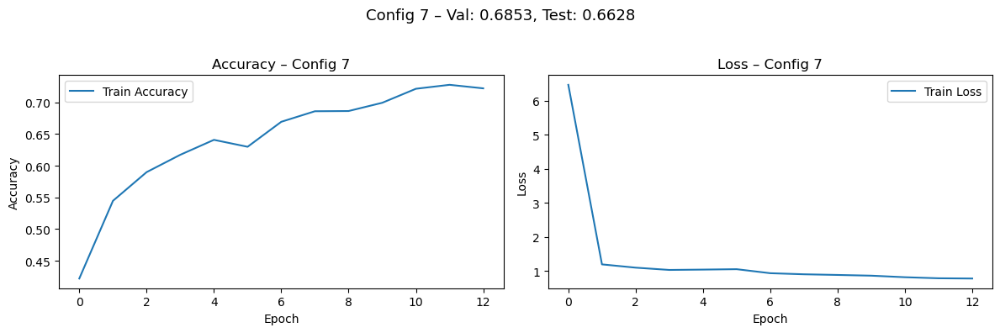

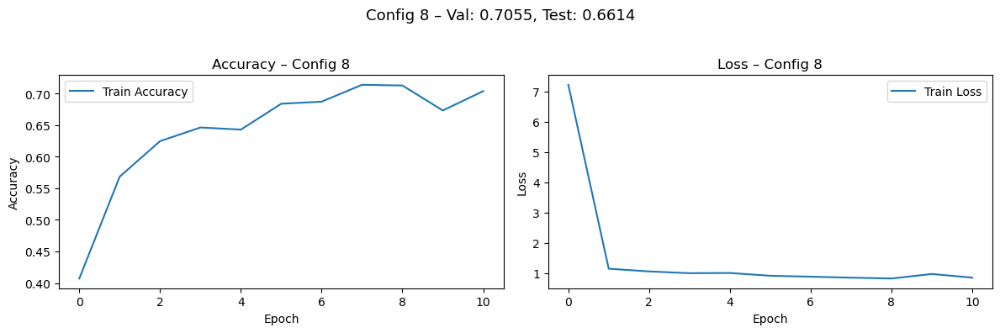

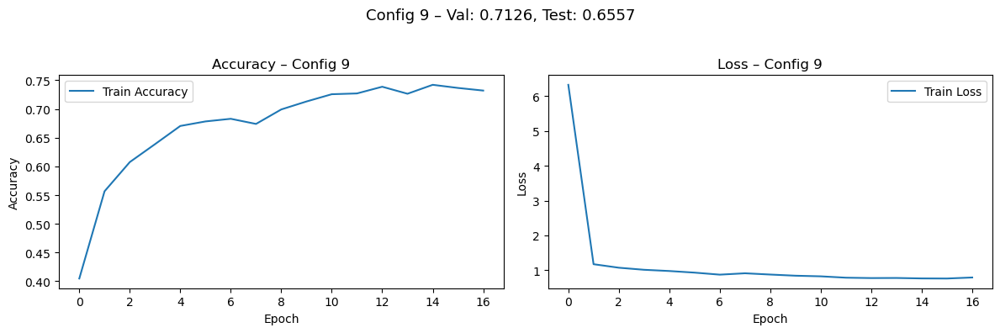

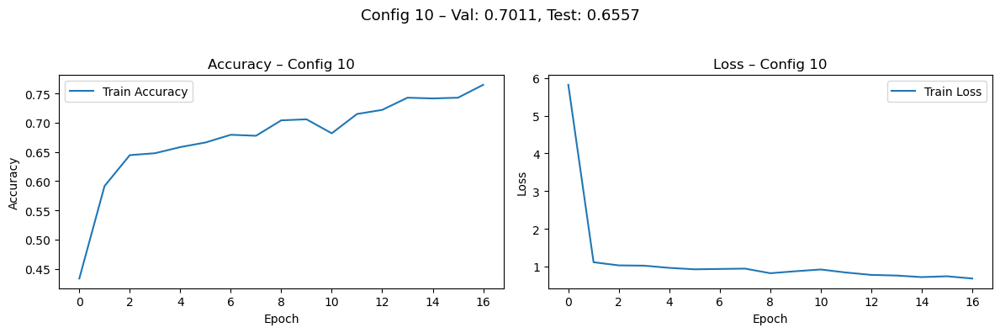

In [36]:
for i, r in enumerate(results):
    history = r.get('history', None)
    
    if history is None:
        print(f"[WARNING] No training history for config {i+1} available – please log the history.")
        continue

    config = r['config']
    val_acc = r['val_acc']
    test_acc = r['test_acc']

    acc_key = 'accuracy' if 'accuracy' in history else 'acc'
    val_acc_key = 'val_accuracy' if 'val_accuracy' in history else 'val_acc'

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history[acc_key], label='Train Accuracy')
    plt.title(f'Accuracy – Config {i+1}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Train Loss')
    plt.title(f'Loss – Config {i+1}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle(f'Config {i+1} – Val: {val_acc:.4f}, Test: {test_acc:.4f}', fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Plot the results of the training

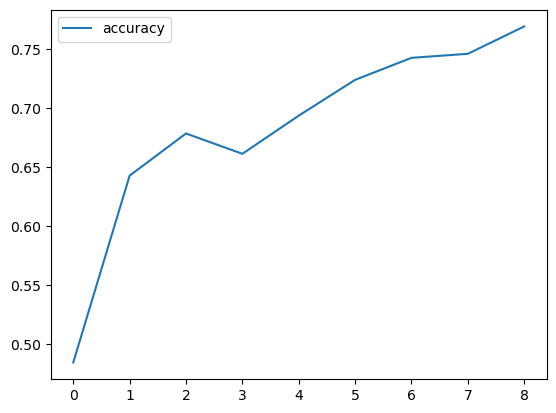

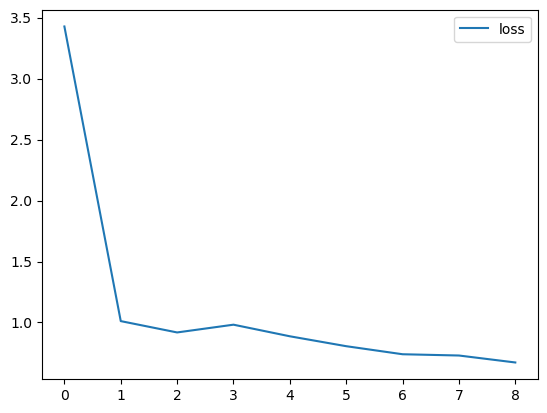

In [8]:
plt.plot(history.history['acc'], label='accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='loss')
plt.legend()

# Test the model on the test data

1/1 [==============================] - 1s 1s/step


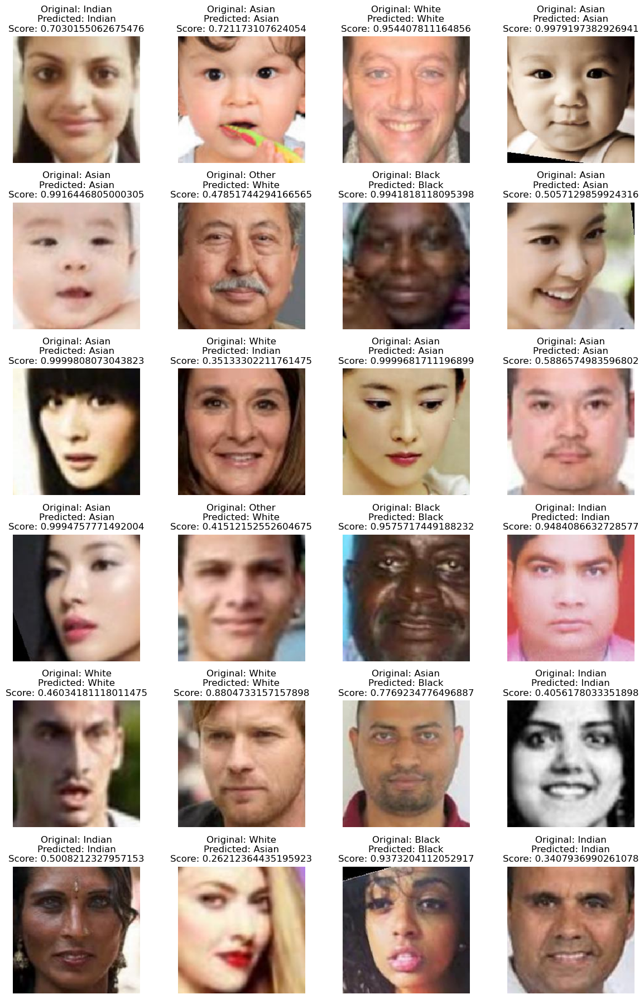

In [9]:
x_batch, y_batch = next(test_gen)
predictions = model.predict(x_batch)

predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_batch, axis=1)

num_images = x_batch.shape[0]
cols = 4
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
axes = axes.flatten()

for i in range(num_images):
    ax = axes[i]
    ax.imshow(x_batch[i])

    true_label = class_labels[true_labels[i]]
    predicted_label = class_labels[predicted_labels[i]]
    prediction_score = predictions[i][predicted_labels[i]]

    ax.set_title(f"Original: {true_label}\nPredicted: {predicted_label}\nScore: {prediction_score}")
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Test the model on my own data

1/1 [==============================] - 1s 1s/step


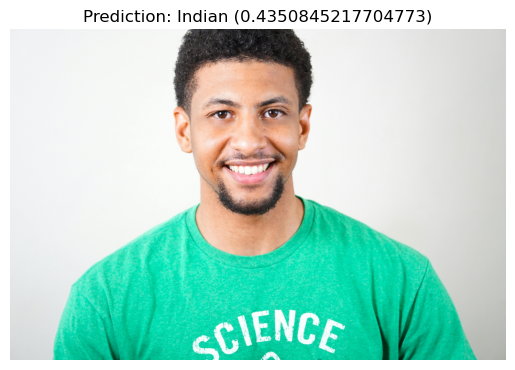

1/1 [==============================] - 0s 34ms/step


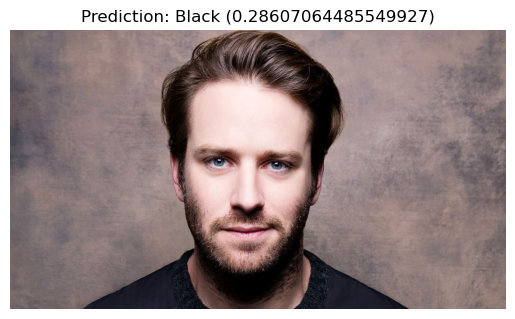

1/1 [==============================] - 0s 33ms/step


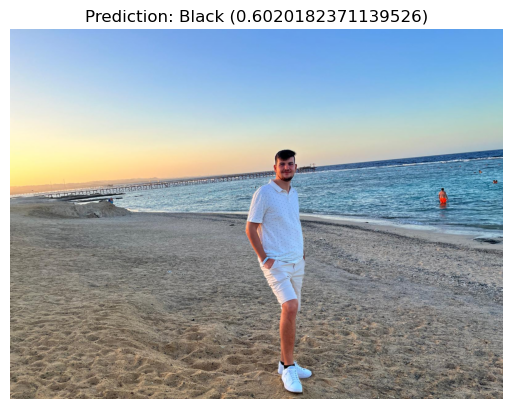

1/1 [==============================] - 0s 33ms/step


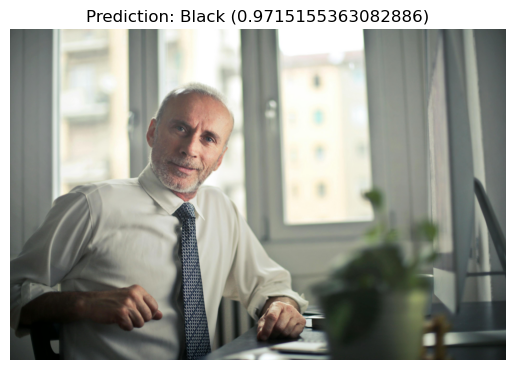

1/1 [==============================] - 0s 32ms/step


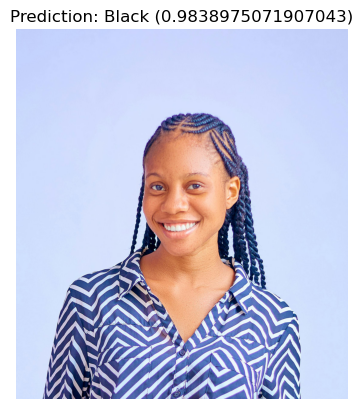

1/1 [==============================] - 0s 36ms/step


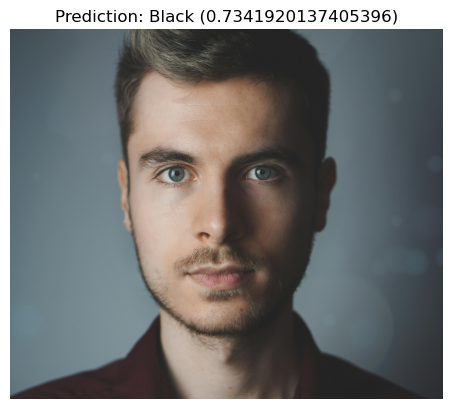

1/1 [==============================] - 0s 34ms/step


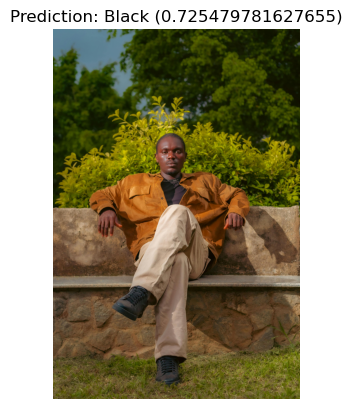

1/1 [==============================] - 0s 27ms/step


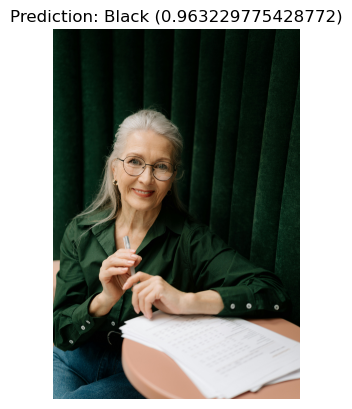

1/1 [==============================] - 0s 35ms/step


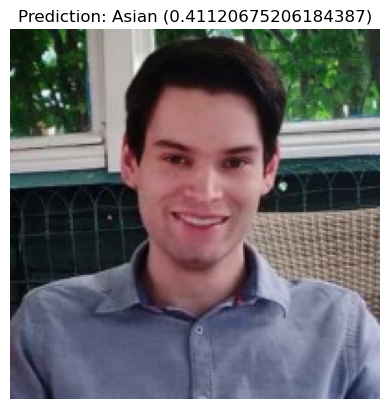

1/1 [==============================] - 0s 29ms/step


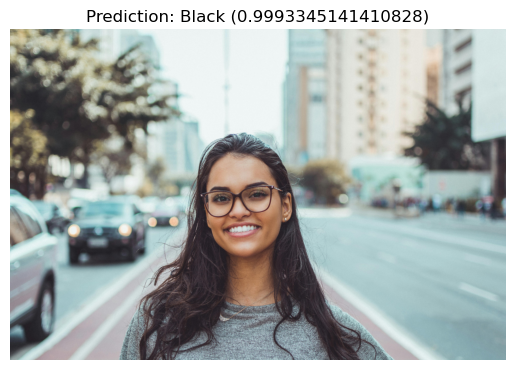

1/1 [==============================] - 0s 33ms/step


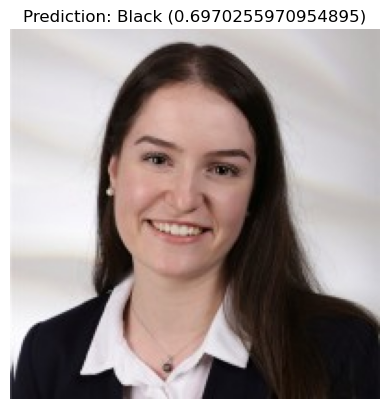

1/1 [==============================] - 0s 33ms/step


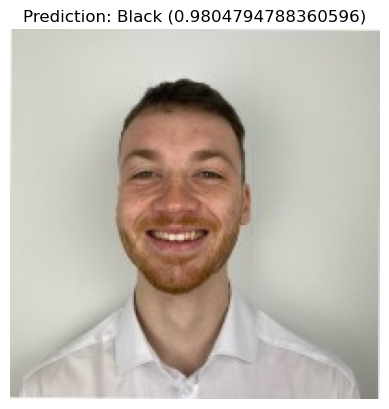

1/1 [==============================] - 0s 34ms/step


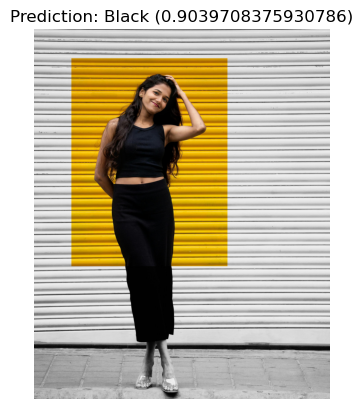

1/1 [==============================] - 0s 33ms/step


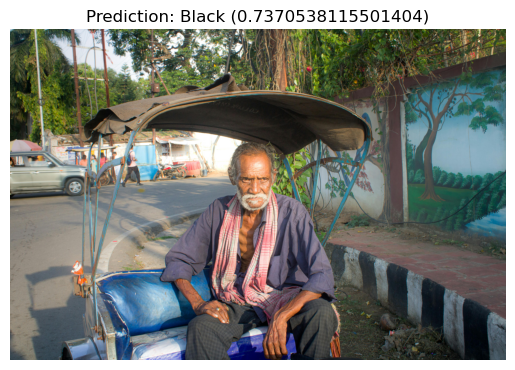

In [10]:
def edit_image(image_path: str) -> np.array: 
    img = load_img(image_path, target_size=target_size)

    img_array = img_to_array(img)
    img_array = img_array / 255.0 

    img_array = np.expand_dims(img_array, axis=0)

    return img_array

images = glob.glob('../Images/*.jpg')

for i, image in enumerate(images):
        img_array = edit_image(image)

        prediction = model.predict(img_array)

        predicted_label_index = np.argmax(prediction, axis=1)[0]
        predicted_label = class_labels[predicted_label_index]
        confidence = prediction[0][predicted_label_index]

        plt.imshow(load_img(image))
        plt.title(f"Prediction: {predicted_label} ({confidence:})")
        plt.axis("off")
        plt.show()

# Evaluate the model ans save it to a file

In [11]:
model.evaluate(test_gen)
model.save("../Models/With_DA_Pipeline/Nation_classification")

30/30 [==============================] - 1s 38ms/step - loss: 0.9518 - acc: 0.6815
INFO:tensorflow:Assets written to: ../Models/With_DA_Pipeline/Nation_classification/assets


INFO:tensorflow:Assets written to: ../Models/With_DA_Pipeline/Nation_classification/assets


# Test the model on detected and extracted faces

Loading the model: Nation_classification
Predicting with the model which was trained with the pipeline:


W0000 00:00:1753949443.846930   32889 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


1/1 [==============================] - 3s 3s/step


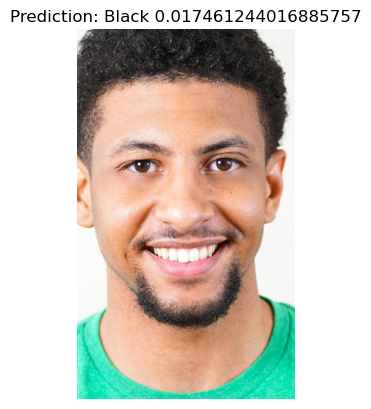

1/1 [==============================] - 0s 37ms/step


W0000 00:00:1753949447.869749   32948 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


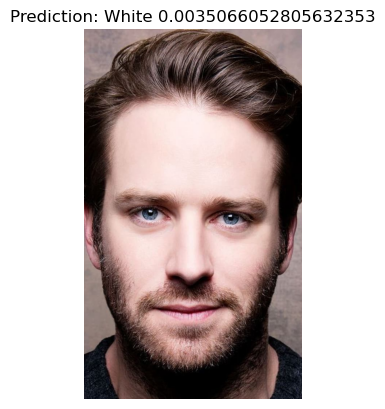

1/1 [==============================] - 0s 33ms/step


W0000 00:00:1753949448.167009   32991 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


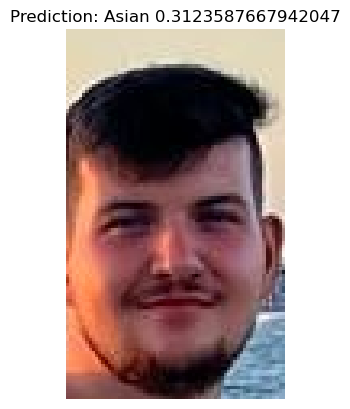

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949448.453050   33034 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


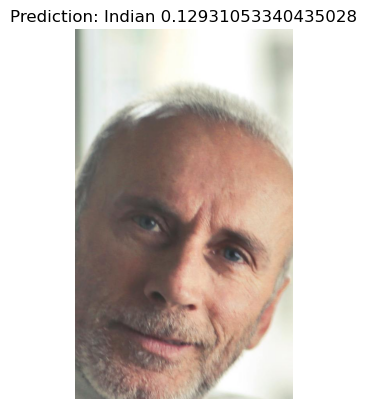

1/1 [==============================] - 0s 33ms/step


W0000 00:00:1753949448.794472   33079 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


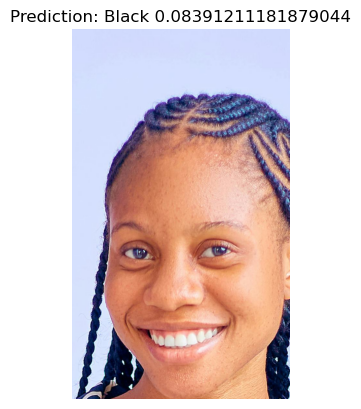

1/1 [==============================] - 0s 37ms/step


W0000 00:00:1753949449.293020   33121 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


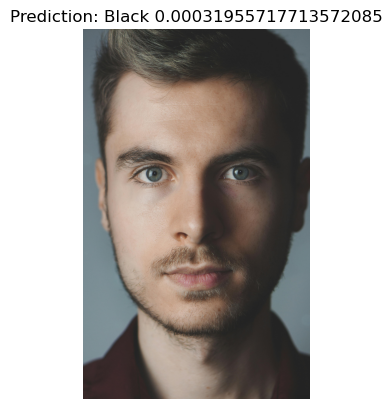

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753949450.520010   33164 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


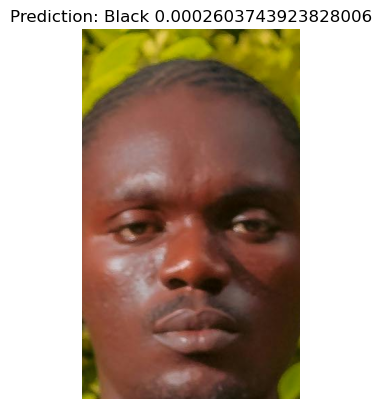

1/1 [==============================] - 0s 33ms/step


W0000 00:00:1753949451.070402   33207 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


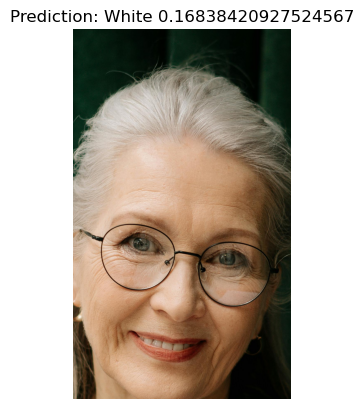

1/1 [==============================] - 0s 29ms/step


W0000 00:00:1753949451.474612   33259 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


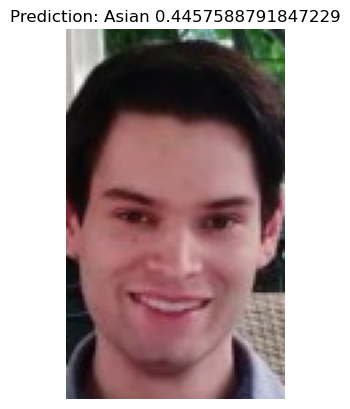

1/1 [==============================] - 0s 34ms/step


W0000 00:00:1753949452.014805   33303 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


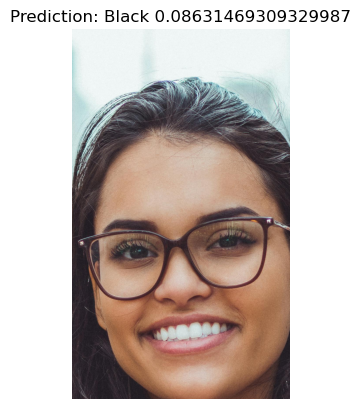

1/1 [==============================] - 0s 30ms/step


W0000 00:00:1753949452.405147   33347 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


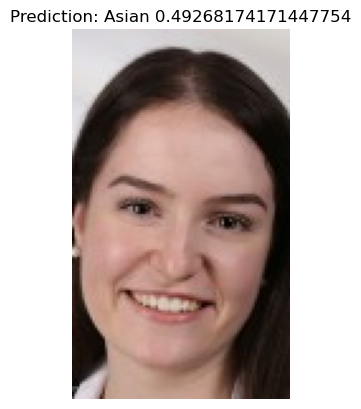

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949452.636569   33390 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


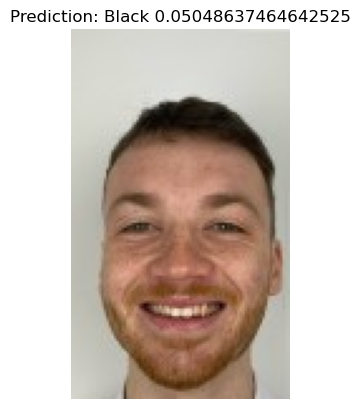

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949453.016107   33433 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


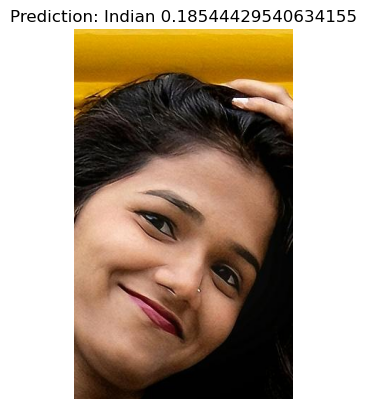

1/1 [==============================] - 0s 32ms/step


W0000 00:00:1753949453.569954   33476 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


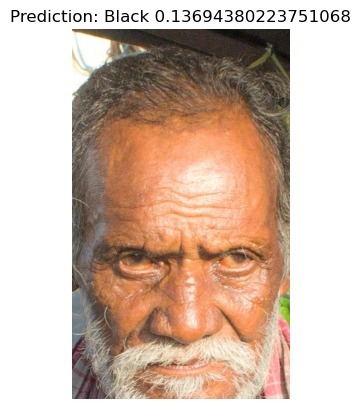

Predicting with the model which was trained without the pipeline:


W0000 00:00:1753949454.100400   33527 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


1/1 [==============================] - 1s 1s/step


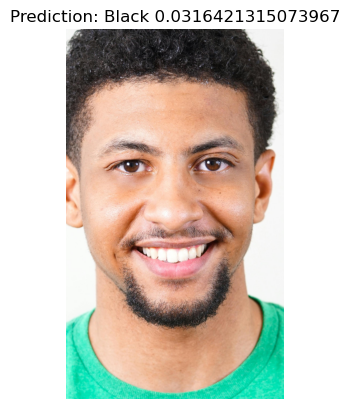

1/1 [==============================] - 0s 33ms/step


W0000 00:00:1753949455.798963   33581 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


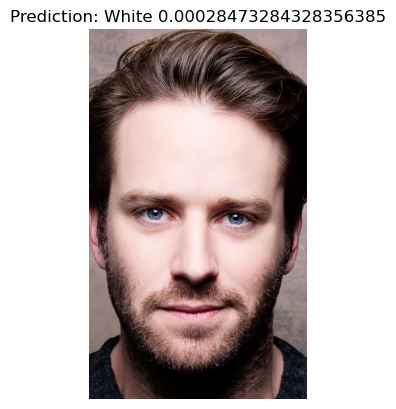

1/1 [==============================] - 0s 37ms/step


W0000 00:00:1753949456.099315   33622 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


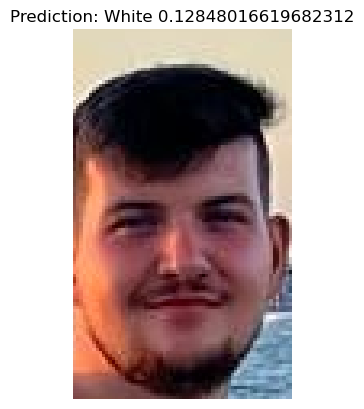

1/1 [==============================] - 0s 37ms/step


W0000 00:00:1753949456.379352   33665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


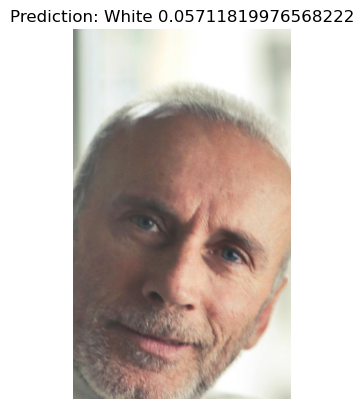

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949456.712106   33715 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


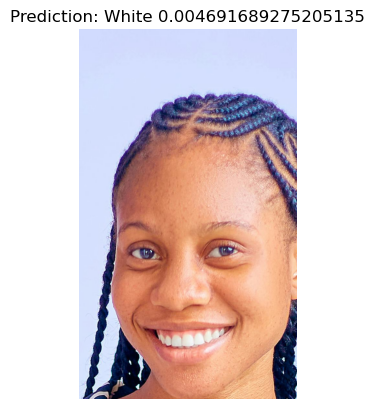

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753949457.156881   33758 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


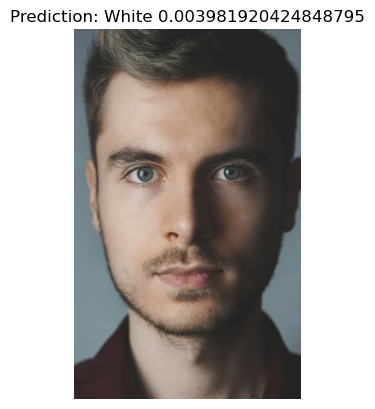

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949458.332683   33805 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


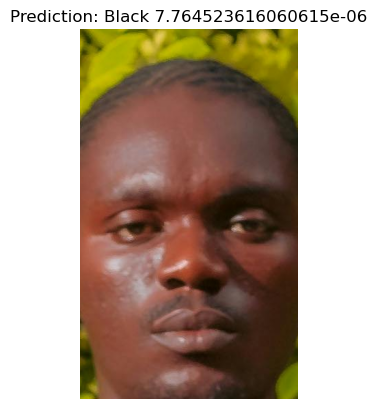

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753949458.837281   33848 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


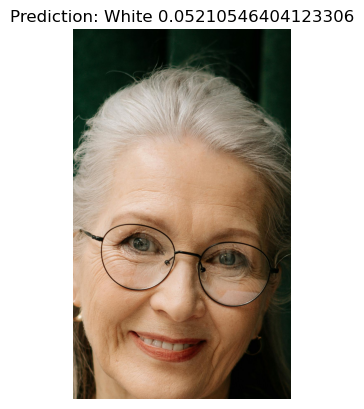

1/1 [==============================] - 0s 31ms/step


W0000 00:00:1753949459.254565   33891 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


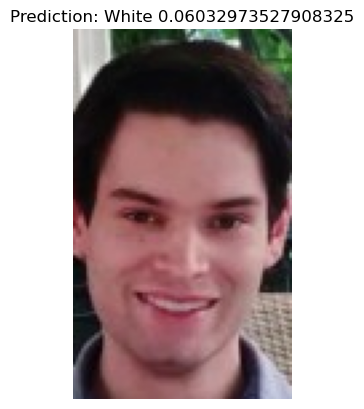

1/1 [==============================] - 0s 34ms/step


W0000 00:00:1753949459.757107   33934 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


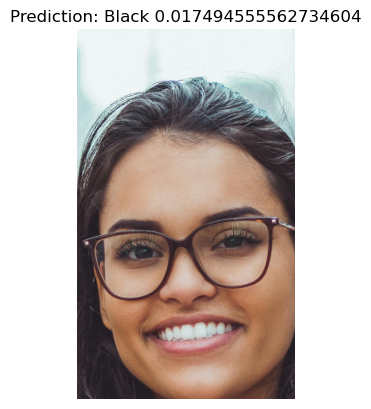

1/1 [==============================] - 0s 34ms/step


W0000 00:00:1753949460.151650   33977 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


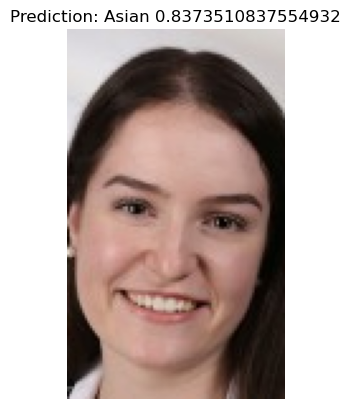

1/1 [==============================] - 0s 33ms/step


W0000 00:00:1753949460.379038   34020 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


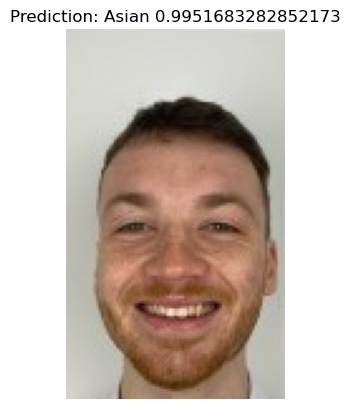

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753949460.724816   34063 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


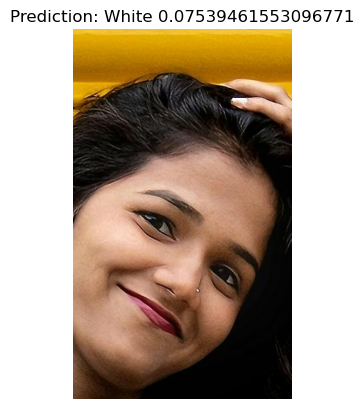

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753949461.245112   34106 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


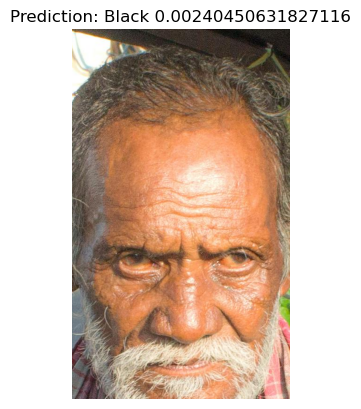

In [15]:
print(f"Loading the model: Nation_classification")
model_with_pipeline = load_model("../Models/With_DA_Pipeline/Nation_classification")
model_without_pipeline = load_model("../Models/Without_DA_Pipeline/Nation_classification")

print("Predicting with the model which was trained with the pipeline:")
predict_detected_faces(model=model_with_pipeline, class_names=class_labels, padding=0.2, image_directory="../Images/*.jpg", categorical=True)
print("Predicting with the model which was trained without the pipeline:")
predict_detected_faces(model=model_without_pipeline, class_names=class_labels, padding=0.2, image_directory="../Images/*.jpg", categorical=True)